<a href="https://colab.research.google.com/github/NoorFatimaMemon/DeepLearning/blob/main/24_Object_Detection_with_SSD/24_Object_Detection_with_SSD_(Tensorflow_Edition).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Object Detection with SSD (Tensorflow Edition)**

## **Installing Required Packages**

In [1]:
# pycocotools is for COCO dataset annotations & tf_slim is for lightweight wrapper for TF models
!pip install pycocotools tf_slim
# Downgrade protobuf to a compatible version
!pip uninstall protobuf -y

In [2]:
!curl -OL https://github.com/protocolbuffers/protobuf/releases/download/v21.12/protoc-21.12-linux-x86_64.zip
!unzip -o protoc-21.12-linux-x86_64.zip -d protoc3
!sudo mv protoc3/bin/* /usr/local/bin/
!sudo mv protoc3/include/* /usr/local/include/
!protoc --version

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 1548k  100 1548k    0     0  2404k      0 --:--:-- --:--:-- --:--:-- 2404k
Archive:  protoc-21.12-linux-x86_64.zip
  inflating: protoc3/bin/protoc      
  inflating: protoc3/include/google/protobuf/any.proto  
  inflating: protoc3/include/google/protobuf/api.proto  
  inflating: protoc3/include/google/protobuf/compiler/plugin.proto  
  inflating: protoc3/include/google/protobuf/descriptor.proto  
  inflating: protoc3/include/google/protobuf/duration.proto  
  inflating: protoc3/include/google/protobuf/empty.proto  
  inflating: protoc3/include/google/protobuf/field_mask.proto  
  inflating: protoc3/include/google/protobuf/source_context.proto  
  inflating: protoc3/include/google/protobuf/struct.proto  
  inflating: protoc3/include/google/protobuf/t

## **Clone TensorFlow Models Repository**

In [3]:
# Clones TensorFlow's models repo, which contains object detection code and pre-trained models.
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


## **Compile Protobufs and Install Object Detection API**

In [4]:
# Compile protobufs (protocol buffers) and install object detection API
%%bash
cd models/research
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached protobuf-5.29.5-cp38-abi3-manylinux2014_x86_64.whl.metadata (592 bytes)
Using cached protobuf-5.29.5-cp38-abi3-manylinux2014_x86_64.whl (319 kB)
  Created wheel for object_detection: filename=object_detection-0.1-py3-none-any.whl size=1655448 sha256=b21c69cba0175e596e09006d7ab63d1fafcf1d8d6469a524529d1a14c86e8854
  Stored in directory: /tmp/pip-ephem-wheel-cache-m4_19e5h/wheels/95/4a/63/b2d36ca06eab841de19a38993ffaf2beac152a44539bc642a6
Successfully built object_detection
  Attempting uninstall: object_detection
    Found existing installation: object_detection 0.1
    Uninstalling object_detection-0.1:
      Successfully uninstalled object_detection-0.1


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.11.0 requires tensorflow==2.18.0, but you have tensorflow 2.19.0 which is incompatible.
grpcio-status 1.71.2 requires grpcio>=1.71.2, but you have grpcio 1.65.5 which is incompatible.


In [5]:
%%bash
cd models/research/object_detection/packages/tf2
pip install . --use-deprecated=legacy-resolver --no-deps

Processing /content/models/research/object_detection/packages/tf2
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for object_detection: filename=object_detection-0.1-py3-none-any.whl size=1195 sha256=49296c2f089734a3f15c86647c130a9d35de04ea6198128cb12f86a90d1ce22d
  Stored in directory: /tmp/pip-ephem-wheel-cache-u0pyi603/wheels/df/67/dc/61c38cee405b9b11b58f0757a36f22989fd8e82ab468b2fde3
Successfully built object_detection
  Attempting uninstall: object_detection
    Found existing installation: object_detection 0.1
    Uninstalling object_detection-0.1:
      Successfully uninstalled object_detection-0.1


In [6]:
import sys
import os

# Add the models/research and models/research/slim directories to sys.path
models_research_dir = os.path.join('/content/models/research')
models_slim_dir = os.path.join('/content/models/research/slim')

if models_research_dir not in sys.path:
    sys.path.append(models_research_dir)
    print(f"Added {models_research_dir} to sys.path")

if models_slim_dir not in sys.path:
    sys.path.append(models_slim_dir)
    print(f"Added {models_slim_dir} to sys.path")

# Verify the paths have been added
print("Updated sys.path:", sys.path)

# Attempt to import the object detection modules again
try:
    from object_detection.utils import ops as utils_ops
    from object_detection.utils import label_map_util
    from object_detection.utils import visualization_utils as vis_util
    print("Object detection modules imported successfully after updating sys.path!")
except ModuleNotFoundError as e:
    print(f"Import failed again after updating sys.path: {e}")
except Exception as e:
    print(f"An unexpected error occurred during import after updating sys.path: {e}")

Added /content/models/research to sys.path
Added /content/models/research/slim to sys.path
Updated sys.path: ['/content', '/env/python', '/usr/lib/python311.zip', '/usr/lib/python3.11', '/usr/lib/python3.11/lib-dynload', '', '/usr/local/lib/python3.11/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.11/dist-packages/IPython/extensions', '/usr/local/lib/python3.11/dist-packages/setuptools/_vendor', '/root/.ipython', '/content/models/research', '/content/models/research/slim']
Object detection modules imported successfully after updating sys.path!


## **Import Required Libraries**

In [21]:
# Import general libraries
import pathlib
import numpy as np
import six.moves.urllib as urllib
import tarfile
import tensorflow as tf
import zipfile
import shutil

In [16]:
# Import Visualization, image handling, and display tools.
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

## **Load SSD Model Function**

In [26]:
# Downloads the pre-trained model .tar.gz and extracts it
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'

  # it downloads the model by combining base_url and model_file. untar=False tells the function not to extract the file after downloading it.
  downloaded_file_path = tf.keras.utils.get_file(fname=model_file, origin=base_url + model_file, untar=False)

  model_dir = os.path.dirname(downloaded_file_path)
  extracted_model_path = os.path.join(model_dir, model_name) # This is the directory where the tar content should be extracted

  # Check if the extracted directory already exists and remove it
  if os.path.exists(extracted_model_path) and os.path.isdir(extracted_model_path):
      print(f"Removing existing extracted directory: {extracted_model_path}")
      shutil.rmtree(extracted_model_path)
      print("Extracted directory removed.")

  # Ensure we are opening the actual downloaded file path
  tar_file_path = downloaded_file_path
  if not os.path.exists(os.path.join(extracted_model_path, "saved_model")):
      print(f"Extracting {model_file} from {tar_file_path} to {model_dir}")
      with tarfile.open(tar_file_path, 'r:gz') as tar:
          # Extract all contents into the directory named after the model
          tar.extractall(path=model_dir)
      print("Extraction complete.")

  model_path = os.path.join(extracted_model_path, "saved_model")

  # Verify the model path exists
  if not os.path.exists(model_path):
      raise FileNotFoundError(f"SavedModel directory not found at: {model_path}")

  print(f"Loading model from: {model_path}")
  model = tf.saved_model.load(str(model_path))
  model = model.signatures['serving_default']
  return model

## **Loading label map**
Label maps map indices to category names so that when our convolution network predicts 5, we know that this corresponds to an airplane

In [18]:
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## **Set Paths to Test Images**

In [19]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('models/research/object_detection/test_images/image1.jpg'),
 PosixPath('models/research/object_detection/test_images/image2.jpg'),
 PosixPath('models/research/object_detection/test_images/image3.jpg')]

## **Load the object detection Model using Tensorflow API**

In [27]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

Removing existing extracted directory: /root/.keras/datasets/ssd_mobilenet_v1_coco_2017_11_17
Extracted directory removed.
Extracting ssd_mobilenet_v1_coco_2017_11_17.tar.gz from /root/.keras/datasets/ssd_mobilenet_v1_coco_2017_11_17.tar.gz to /root/.keras/datasets
Extraction complete.
Loading model from: /root/.keras/datasets/ssd_mobilenet_v1_coco_2017_11_17/saved_model


## **Check Model Input and Output Types**

In [28]:
print(detection_model.inputs)
detection_model.output_dtypes

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


{'detection_classes': tf.float32,
 'num_detections': tf.float32,
 'detection_boxes': tf.float32,
 'detection_scores': tf.float32}

## **Inference Function**

In [29]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  input_tensor = tf.convert_to_tensor(image)
  input_tensor = input_tensor[tf.newaxis,...]   # model expects a batch of images.
  output_dict = model(input_tensor)

  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(output_dict['detection_masks'], output_dict['detection_boxes'],
                                                                          image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

## **Visualize Predictions**

In [30]:
def show_inference(model, image_path):
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(image_np, output_dict['detection_boxes'], output_dict['detection_classes'],
                                                     output_dict['detection_scores'], category_index,
                                                     instance_masks=output_dict.get('detection_masks_reframed', None),
                                                     use_normalized_coordinates=True, line_thickness=8)
  display(Image.fromarray(image_np))

## **Run Detection on All Test Images**

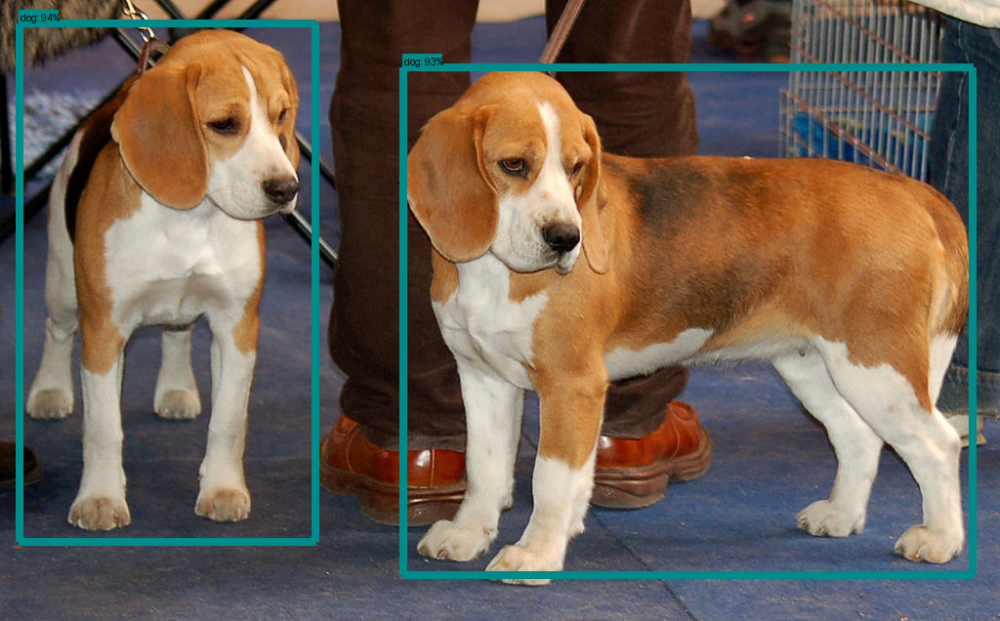

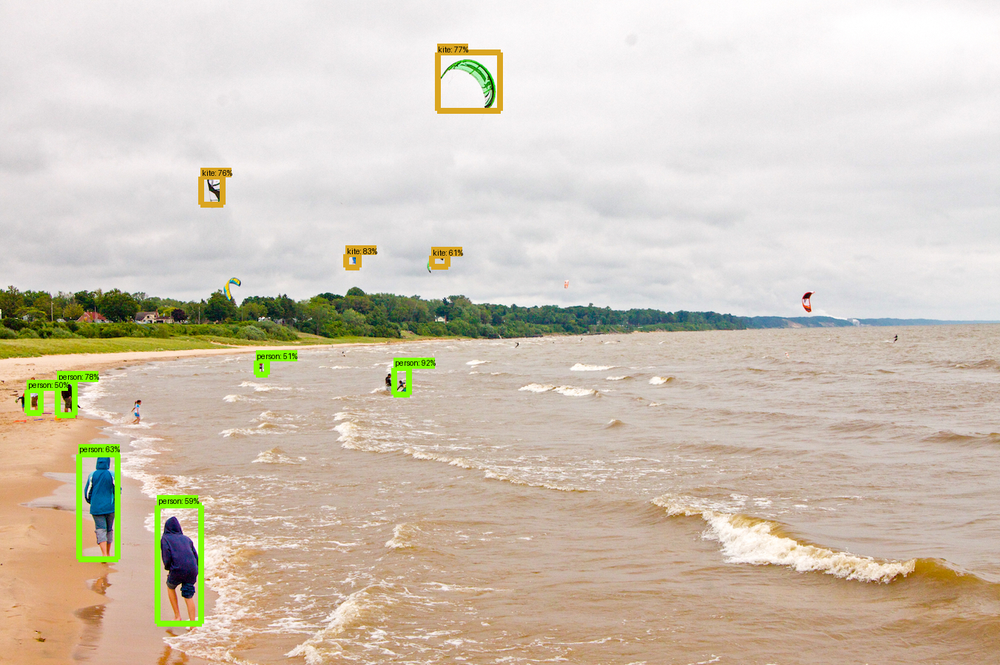

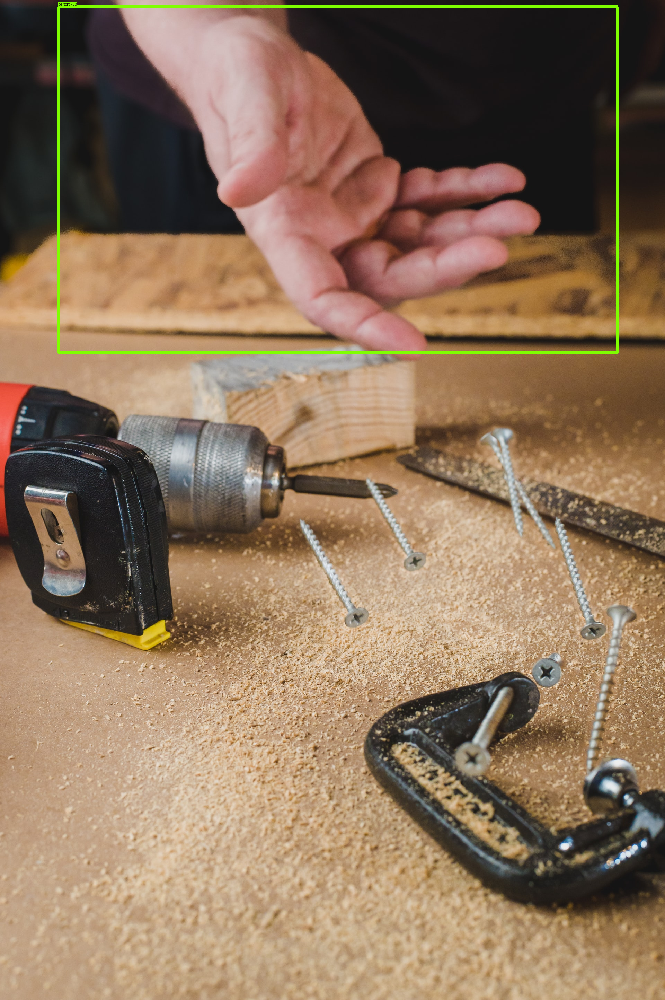

In [34]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)